In [1]:
import numpy as np
import pandas as pd
import librosa as lb
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import os
import matplotlib.pyplot as plt

In [2]:
# ---- Data ----
DATASET_DIR     = "audio_augmented_x10"
FORMAT          = ".wav"
SAMPLE_RATE     = 16000
DURATION        = 4 #sec

# --- Random State/Reproducability ---
RANDOM_SEED     = 42
np.random.seed(RANDOM_SEED)

# --- Split ---
TEST_SIZE       = 0.2
VALIDATION_SIZE = 0.1
TRAIN_SIZE      = 0.7

# ---- Mel Spectrogram ----
N_MELS          = 128
N_FFT           = 2048
HOP_LENGTH      = 512

# --- Training --- #
EPOCHS          = 50
PATIENCE        = 10

In [3]:
def find_data(folder: Path):
    for data in folder.rglob("*"):
        if data.is_file() and data.suffix.lower() == FORMAT:
            yield data

def build_index(data_dir: dict) ->pd.DataFrame:
    root = Path(data_dir)
    if not root.exists():
        raise FileNotFoundError(
            f"DATA_DIR '{data_dir}' doesn't exist."
            f"Upload FakeMusicCaps to Drive and update DATA_DIR."
        )
    
    rows = []

    for file in find_data(root):
        name = file.stem
        parts = name.split("_")
        chord = parts[2]+"_"+parts[3]
        rows.append({
            "filepath": str(file),
            "label": chord,
            })

    df = pd.DataFrame(rows)
    if df.empty:
        raise RuntimeError("No audio files found. Please check DATASET_DIR.")
    
    return df

df = build_index(DATASET_DIR)
print(f"Found {len(df)} audio files.")
print(f"\nCounts by label:\n {df['label'].value_counts()}")


Found 43200 audio files.

Counts by label:
 label
Af_a    900
Af_d    900
Af_j    900
Af_n    900
An_a    900
An_d    900
An_j    900
An_n    900
Bf_a    900
Bf_d    900
Bf_j    900
Bf_n    900
Bn_a    900
Bn_d    900
Bn_j    900
Bn_n    900
Cn_a    900
Cn_d    900
Cn_j    900
Cn_n    900
Df_a    900
Df_d    900
Df_j    900
Df_n    900
Dn_a    900
Dn_d    900
Dn_j    900
Dn_n    900
Ef_a    900
Ef_d    900
Ef_j    900
Ef_n    900
En_a    900
En_d    900
En_j    900
En_n    900
Fn_a    900
Fn_d    900
Fn_j    900
Fn_n    900
Gf_a    900
Gf_d    900
Gf_j    900
Gf_n    900
Gn_a    900
Gn_d    900
Gn_j    900
Gn_n    900
Name: count, dtype: int64


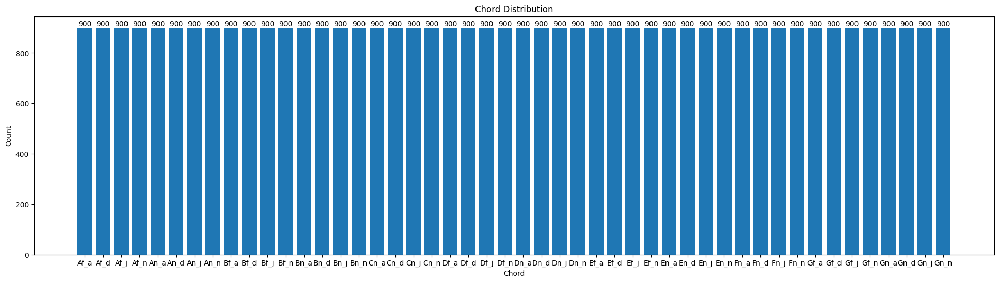

In [4]:
dis_count = df["label"].value_counts()
plt.figure(figsize=(24, 6))

bars = plt.bar(dis_count.index, dis_count.values)
plt.bar_label(bars)

plt.xlabel("Chord")
plt.ylabel("Count")
plt.title("Chord Distribution")

plt.show()

In [5]:
def load_audio(
    filepath: str,
    sample_rate: int = SAMPLE_RATE
) -> np.ndarray:

    y, sr = lb.load(
        filepath,
        sr=sample_rate,
        mono=True,
        duration=DURATION
    )

    return y.astype(np.float32)

def split_data(
    df: pd.DataFrame,
    seed: int = RANDOM_SEED
):

    train_df, temp_df = train_test_split(
        df,
        train_size=TRAIN_SIZE,
        stratify=df["label"],
        random_state=seed
    )

    valid_ratio = VALIDATION_SIZE / (
        VALIDATION_SIZE + TEST_SIZE
    )

    valid_df, test_df = train_test_split(
        temp_df,
        train_size=valid_ratio,
        stratify=temp_df["label"],
        random_state=seed
    )

    return train_df, valid_df, test_df

def normalization(audio: np.ndarray):

    max_val = np.max(np.abs(audio))

    if max_val > 0:
        audio = audio / max_val

    return audio.astype(np.float32)

def extract_mel_spectrogram(audio):

    mel = lb.feature.melspectrogram(
        y=audio,
        sr=SAMPLE_RATE,
        n_fft=N_FFT,
        hop_length=HOP_LENGTH,
        n_mels=N_MELS
    )

    mel_db = lb.power_to_db(
        mel,
        ref=np.max
    )
    mel_db = (mel_db - np.mean(mel_db)) / (np.std(mel_db) + 1e-8)
    return mel_db.astype(np.float32)

def extract_chromagram(audio):

    chroma = lb.feature.chroma_stft(
        y=audio,
        sr=SAMPLE_RATE,
        n_fft=N_FFT,
        hop_length=HOP_LENGTH
    )

    # Standardization
    chroma = (
        chroma - np.mean(chroma)
    ) / (
        np.std(chroma) + 1e-8
    )

    return chroma.astype(np.float32)

def extract_mfcc(audio):

    mfcc = lb.feature.mfcc(
        y=audio,
        sr=SAMPLE_RATE,
        n_mfcc=13,
        n_fft=N_FFT,
        hop_length=HOP_LENGTH
    )

    # Standardization
    mfcc = (
        mfcc - np.mean(mfcc)
    ) / (
        np.std(mfcc) + 1e-8
    )

    return mfcc.astype(np.float32)


# def add_noise(audio: np.ndarray, sr: int = SAMPLE_RATE) -> np.ndarray:

#     if np.random.rand() < 0.4:
#         bg_noise = np.random.randn(len(audio)) * np.random.uniform(0.0005, 0.005)

#         # Low-pass filter to make it sound like real room noise
#         b, a    = butter(N=4, Wn=300/(sr/2), btype='low')
#         bg_noise = filtfilt(b, a, bg_noise)

#         audio = audio + bg_noise
#     audio = np.clip(audio, -1.0, 1.0)

#     return audio


def preprocess(filepath: str, feature: str):
    # Load
    audio = load_audio(filepath)

    # Normalize
    audio = normalization(audio)

    out = []

    match feature:
        case "mel":
            # mel spectrogram
            out = extract_mel_spectrogram(audio)
        case "mfcc":
            # mfcc
            out = extract_mfcc(audio)
        case "chroma":
            # chromagram
            out = extract_chromagram(audio)
        case _:
            raise ValueError(    
                f"Unknown feature extraction type: '{feature}'. "
                f"Available options are: 'mel', 'mfcc', 'chroma'."
            )

    return out

def feature_ext_split(
    split_df,
    name,
    cache_dir,
    feature_type
):

    Path(cache_dir).mkdir(
        parents=True,
        exist_ok=True
    )

    x_path = Path(cache_dir) / f"{name}_x.npy"
    y_path = Path(cache_dir) / f"{name}_y.npy"

    if x_path.exists() and y_path.exists():

        x = np.load(x_path)
        y = np.load(y_path)

        return x, y

    x = []
    y = []

    n_files = len(split_df)

    for idx, row in enumerate(split_df.itertuples()):

        filepath = row.filepath
        label = row.label

        try:

            feature = preprocess(filepath, feature_type)

            x.append(feature)
            y.append(label)

            print(
                f"[{idx+1}/{n_files}] "
                f"Processed: {filepath}"
            )

        except Exception as e:

            print(
                f"Error processing {filepath}: {e}"
            )


    x = np.array(x, dtype=np.float32)
    y = np.array(y)


    x = x[..., np.newaxis]

    np.save(x_path, x)
    np.save(y_path, y)

    print(f"{feature_type} has been extracted from t")

    # return x, y <--- uncomment this if your want to take the result


train_df, val_df, test_df = split_data(df)

In [6]:
print(len(train_df))
print(len(val_df))
print(len(test_df))

30239
4320
8641


In [7]:
feature_ext_split(train_df, "train", "mel_cache", "mel")
feature_ext_split(val_df, "val", "mel_cache", "mel")
feature_ext_split(test_df, "test", "mel_cache", "mel")

[1/30239] Processed: audio_augmented_x10\piano_3_Cn_j_p_71.wav
[2/30239] Processed: audio_augmented_x10\piano_2_Bn_d_p_26.wav
[3/30239] Processed: audio_augmented_x10\piano_3_Bn_d_p_90.wav
[4/30239] Processed: audio_augmented_x10\piano_2_En_a_p_72.wav
[5/30239] Processed: audio_augmented_x10\piano_3_An_a_p_76.wav
[6/30239] Processed: audio_augmented_x10\piano_2_Fn_n_m_99.wav
[7/30239] Processed: audio_augmented_x10\piano_2_An_j_p_10.wav
[8/30239] Processed: audio_augmented_x10\piano_2_En_n_m_31.wav
[9/30239] Processed: audio_augmented_x10\piano_3_En_n_f_24.wav
[10/30239] Processed: audio_augmented_x10\piano_2_An_a_p_63.wav
[11/30239] Processed: audio_augmented_x10\piano_3_Ef_j_f_90.wav
[12/30239] Processed: audio_augmented_x10\piano_4_Ef_d_f_63.wav
[13/30239] Processed: audio_augmented_x10\piano_2_Fn_j_p_68.wav
[14/30239] Processed: audio_augmented_x10\piano_4_An_n_f_47.wav
[15/30239] Processed: audio_augmented_x10\piano_4_Df_d_p_11.wav
[16/30239] Processed: audio_augmented_x10\piano_2

In [8]:
feature_ext_split(train_df, "train", "mfcc_cache", "mfcc")
feature_ext_split(val_df, "val", "mfcc_cache", "mfcc")
feature_ext_split(test_df, "test", "mfcc_cache", "mfcc")

[1/30239] Processed: audio_augmented_x10\piano_3_Cn_j_p_71.wav
[2/30239] Processed: audio_augmented_x10\piano_2_Bn_d_p_26.wav
[3/30239] Processed: audio_augmented_x10\piano_3_Bn_d_p_90.wav
[4/30239] Processed: audio_augmented_x10\piano_2_En_a_p_72.wav
[5/30239] Processed: audio_augmented_x10\piano_3_An_a_p_76.wav
[6/30239] Processed: audio_augmented_x10\piano_2_Fn_n_m_99.wav
[7/30239] Processed: audio_augmented_x10\piano_2_An_j_p_10.wav
[8/30239] Processed: audio_augmented_x10\piano_2_En_n_m_31.wav
[9/30239] Processed: audio_augmented_x10\piano_3_En_n_f_24.wav
[10/30239] Processed: audio_augmented_x10\piano_2_An_a_p_63.wav
[11/30239] Processed: audio_augmented_x10\piano_3_Ef_j_f_90.wav
[12/30239] Processed: audio_augmented_x10\piano_4_Ef_d_f_63.wav
[13/30239] Processed: audio_augmented_x10\piano_2_Fn_j_p_68.wav
[14/30239] Processed: audio_augmented_x10\piano_4_An_n_f_47.wav
[15/30239] Processed: audio_augmented_x10\piano_4_Df_d_p_11.wav
[16/30239] Processed: audio_augmented_x10\piano_2

In [9]:
feature_ext_split(train_df, "train", "chroma_cache", "chroma")
feature_ext_split(val_df, "val", "chroma_cache", "chroma")
feature_ext_split(test_df, "test", "chroma_cache", "chroma")

[1/30239] Processed: audio_augmented_x10\piano_3_Cn_j_p_71.wav
[2/30239] Processed: audio_augmented_x10\piano_2_Bn_d_p_26.wav
[3/30239] Processed: audio_augmented_x10\piano_3_Bn_d_p_90.wav
[4/30239] Processed: audio_augmented_x10\piano_2_En_a_p_72.wav
[5/30239] Processed: audio_augmented_x10\piano_3_An_a_p_76.wav
[6/30239] Processed: audio_augmented_x10\piano_2_Fn_n_m_99.wav
[7/30239] Processed: audio_augmented_x10\piano_2_An_j_p_10.wav
[8/30239] Processed: audio_augmented_x10\piano_2_En_n_m_31.wav
[9/30239] Processed: audio_augmented_x10\piano_3_En_n_f_24.wav
[10/30239] Processed: audio_augmented_x10\piano_2_An_a_p_63.wav
[11/30239] Processed: audio_augmented_x10\piano_3_Ef_j_f_90.wav
[12/30239] Processed: audio_augmented_x10\piano_4_Ef_d_f_63.wav
[13/30239] Processed: audio_augmented_x10\piano_2_Fn_j_p_68.wav
[14/30239] Processed: audio_augmented_x10\piano_4_An_n_f_47.wav
[15/30239] Processed: audio_augmented_x10\piano_4_Df_d_p_11.wav
[16/30239] Processed: audio_augmented_x10\piano_2